## Code
---


In [1]:
!PWD

zsh:1: command not found: PWD


In [2]:
HW3_ROOT_PATH = '/home/manavjeet/git/ML/' #'YOUR HOMEWORK3 PATH HERE'
PATH_TO_PART3 = HW3_ROOT_PATH
PATH_TO_COCO = HW3_ROOT_PATH + 'coco/'

In [4]:
%cd $PATH_TO_PART3

/home/manavjeet/git/ML


In [6]:
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Defaulting to user installation because normal site-packages is not writeable


  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-zsfgrq8c
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-zsfgrq8c
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done


In [7]:
%cd -q unet
!ls

2layer_checkpoint.pth	       main.py
2layerdilation_checkpoint.pth  __pycache__
coco.py			       residual2layer_False_checkpoint.pth
concat_checkpoint.pth	       residual2layer_True_checkpoint.pth
dilation1_checkpoint.pth       transforms.py
dilation2_checkpoint.pth       unet.py
images			       util


### Load helper method

In [8]:
import matplotlib.pyplot as plt
import os
import numpy as np

def show_images(folder_path):
    image_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    image_paths = image_paths[:50]
    rows = 5
    cols = 10
    fig, axes = plt.subplots(rows, cols, figsize=(15, 8))
    for i, image_path in enumerate(image_paths):
        image = plt.imread(image_path)
        row = int(i / cols)
        col = i % cols
        axes[row, col].imshow(image)
        axes[row, col].set_title(os.path.basename(image_path))
        axes[row, col].axis('off')
    plt.tight_layout()
    plt.show()

/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [9]:
!python3 main.py --help

device cuda
usage: main.py [-h] [--coco_path COCO_PATH] [--batch_size BATCH_SIZE]
               [--epochs EPOCHS] [--eval] [--load_pretrained]
               [--skip {concat,dilation1,dilation2,2layer,2layerdilation,residual2layer}]
               [--checkpoint CHECKPOINT]

Train a segmentation model on COCO data.

options:
  -h, --help            show this help message and exit
  --coco_path COCO_PATH
                        Path to COCO dataset directory.
  --batch_size BATCH_SIZE
                        Batch size for training.
  --epochs EPOCHS       Epochs for training.
  --eval                Whether to evaluate the model on the validation set.
  --load_pretrained     Whether to evaluate the model on the validation set.
  --skip {concat,dilation1,dilation2,2layer,2layerdilation,residual2layer}
                        Skip connection strategy: either concatenation
                        (concat) or summation (sum).
  --checkpoint CHECKPOINT
                        Path to checkp

In [28]:

!python3 main.py --skip concat --batch_size 5 --coco_path "{PATH_TO_COCO}"


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=False, skip='concat', checkpoint='concat_checkpoint.pth')
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Epoch: [0]  [  0/100]  eta: 0:02:21    time: 1.4195  data: 0.0511  max mem: 2222
Epoch: [0]  [ 10/100]  eta: 0:01:35    time: 1.0645  data: 0.0423  max mem: 2466
Epoch: [0]  [ 20/100]  eta: 0:01:26    time: 1.0642  data: 0.0413  max mem: 2466
Epoch: [0]  [ 30/100]  eta: 0:01:16    time: 1.1010  data: 0.0411  max mem: 2466
Epoch: [0]  [ 40/100]  eta: 0:01:05    time: 1.1048  data: 0.04

In [38]:
!python3 main.py --skip concat --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=False, skip='concat', checkpoint='concat_False_checkpoint.pth')
--------------------------->BATCH SIZE: 5
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Computational complexity:       41.93 GMac
Number of parameters:           31.04 M 
------------------- float32 -------------------
Doing nothing
/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multi

Let us see the masks generated by the best run:
It is okay if the masks are not perfectly aligned. We are only training over 500 images for a short duration!

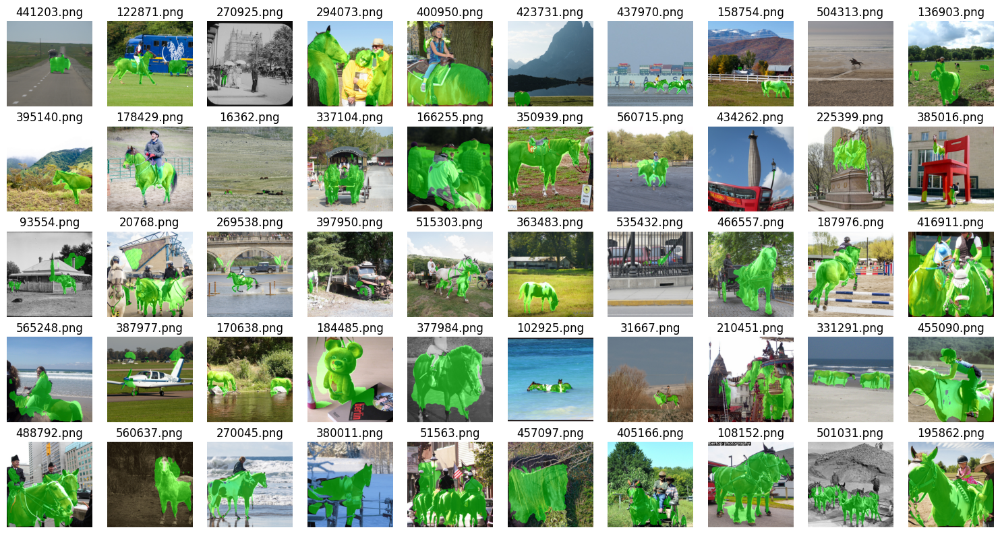

In [12]:
folder_path = 'images'
show_images(folder_path)

## Dilation1

In [18]:
# from unet import Dilation1
# import torch 
# net=Dilation1(n_classes=1)
# net=net.cuda()
# net(torch.zeros((1,3,64,64)).cuda())

/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


tensor([[[[ 0.0358,  0.0263,  0.0809,  ...,  0.1488,  0.1432,  0.0719],
          [ 0.0946,  0.0736, -0.0827,  ...,  0.0494,  0.1122,  0.0774],
          [ 0.0431, -0.1516, -0.0828,  ...,  0.2486,  0.0422, -0.0171],
          ...,
          [ 0.1447,  0.0572,  0.2072,  ...,  0.0095, -0.0305,  0.1236],
          [ 0.1303,  0.1512,  0.1092,  ...,  0.2147, -0.0183,  0.1066],
          [ 0.0961,  0.1098,  0.0617,  ...,  0.1030,  0.0780,  0.0872]]]],
       device='cuda:0', grad_fn=<ConvolutionBackward0>)

In [19]:

!python3 main.py --skip dilation1 --batch_size 5 --coco_path "{PATH_TO_COCO}"


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=False, skip='dilation1', checkpoint='dilation1_checkpoint.pth')
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Epoch: [0]  [  0/100]  eta: 0:02:27    time: 1.4785  data: 0.0522  max mem: 2161
Epoch: [0]  [ 10/100]  eta: 0:01:37    time: 1.0827  data: 0.0425  max mem: 2401
Epoch: [0]  [ 20/100]  eta: 0:01:27    time: 1.0793  data: 0.0421  max mem: 2401
Epoch: [0]  [ 30/100]  eta: 0:01:17    time: 1.1177  data: 0.0419  max mem: 2401
Epoch: [0]  [ 40/100]  eta: 0:01:06    time: 1.1214  data

## Evaluation

In [21]:
!python3 main.py --skip dilation1 --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=False, skip='dilation1', checkpoint='dilation1_checkpoint.pth')
--------------------------->BATCH SIZE: 5
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Performance on validation dataset: mIoU:0.5045150518417358 , mDice:0.6241731643676758


# Dilation 2

In [23]:

!python3 main.py --skip dilation2 --batch_size 5 --coco_path "{PATH_TO_COCO}"


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=False, skip='dilation2', checkpoint='dilation2_checkpoint.pth')
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Epoch: [0]  [  0/100]  eta: 0:02:32    time: 1.5259  data: 0.0524  max mem: 2119
Epoch: [0]  [ 10/100]  eta: 0:01:41    time: 1.1222  data: 0.0431  max mem: 2359
Epoch: [0]  [ 20/100]  eta: 0:01:31    time: 1.1205  data: 0.0434  max mem: 2359
Epoch: [0]  [ 30/100]  eta: 0:01:20    time: 1.1610  data: 0.0432  max mem: 2359
Epoch: [0]  [ 40/100]  eta: 0:01:09    time: 1.1648  data

## Evaluation

In [39]:
!python3 main.py --skip dilation2 --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=False, skip='dilation2', checkpoint='dilation2_False_checkpoint.pth')
--------------------------->BATCH SIZE: 5
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Computational complexity:       32.87 GMac
Number of parameters:           31.04 M 
------------------- float32 -------------------
Doing nothing
/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to

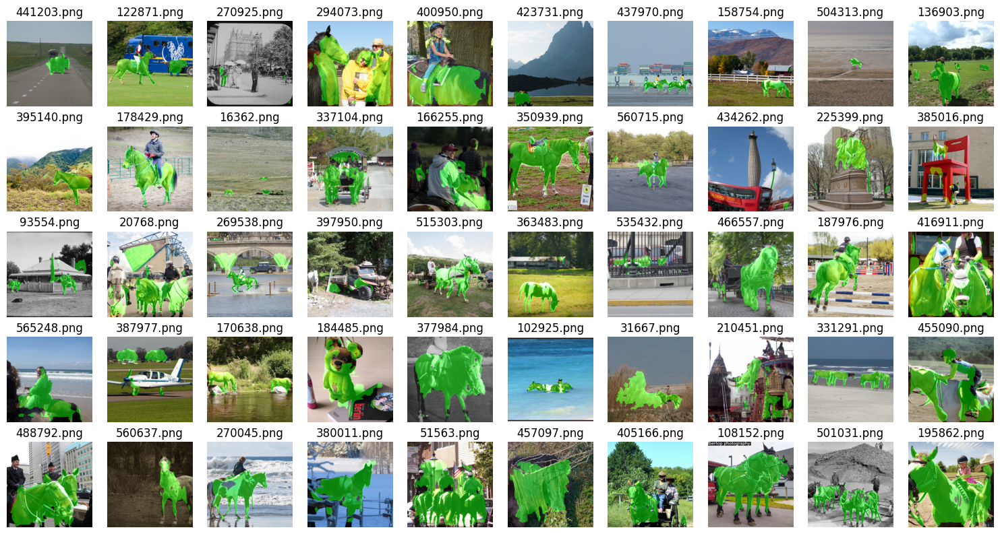

In [25]:
folder_path = 'images'
show_images(folder_path)

# 2Layer

In [9]:

!python3 main.py --skip 2layer --batch_size 5 --coco_path "{PATH_TO_COCO}"


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=False, skip='2layer', checkpoint='2layer_checkpoint.pth')
--------------2layers------------
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Epoch: [0]  [  0/100]  eta: 0:01:38    time: 0.9819  data: 0.0414  max mem: 1845
Epoch: [0]  [ 10/100]  eta: 0:00:57    time: 0.6384  data: 0.0399  max mem: 1860
Epoch: [0]  [ 20/100]  eta: 0:00:51    time: 0.6232  data: 0.0406  max mem: 1860
Epoch: [0]  [ 30/100]  eta: 0:00:44    time: 0.6431  data: 0.0400  max mem: 1860
Epoch: [0]  [ 40/100]  eta: 0

In [40]:
!python3 main.py --skip 2layer --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=False, skip='2layer', checkpoint='2layer_False_checkpoint.pth')
--------------------------->BATCH SIZE: 5
--------------2layers------------
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Computational complexity:       21.97 GMac
Number of parameters:           1.86 M  
--------------2layers------------
------------------- float32 -------------------
Doing nothing
/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available

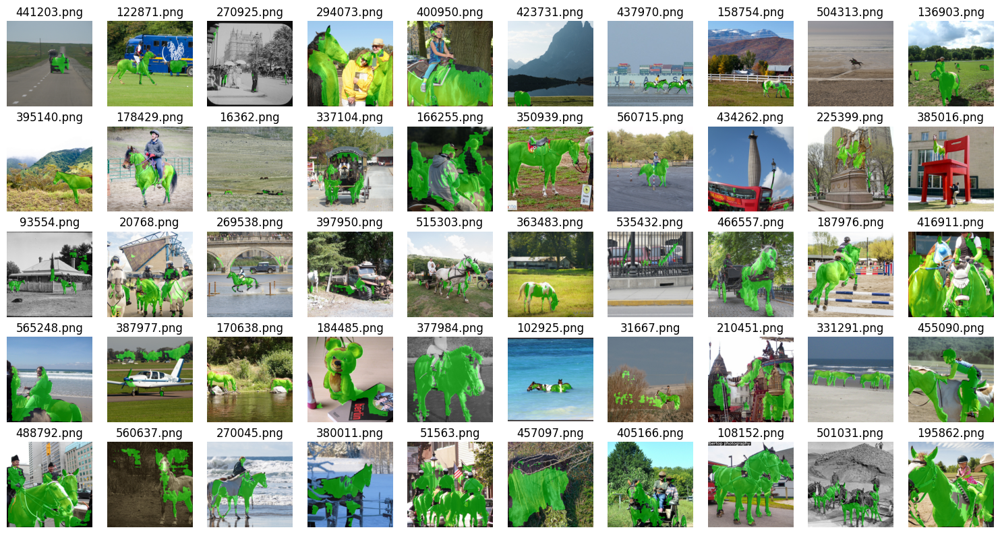

In [11]:
folder_path = 'images'
show_images(folder_path)

# Unet 2 layer with dilation

In [12]:

!python3 main.py --skip 2layerdilation --batch_size 5 --coco_path "{PATH_TO_COCO}"


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=False, skip='2layerdilation', checkpoint='2layerdilation_checkpoint.pth')
--------------2layers------------
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Epoch: [0]  [  0/100]  eta: 0:01:46    time: 1.0664  data: 0.0423  max mem: 1814
Epoch: [0]  [ 10/100]  eta: 0:01:05    time: 0.7276  data: 0.0403  max mem: 1828
Epoch: [0]  [ 20/100]  eta: 0:00:58    time: 0.7163  data: 0.0403  max mem: 1828
Epoch: [0]  [ 30/100]  eta: 0:00:51    time: 0.7389  data: 0.0394  max mem: 1828
Epoch: [0]  [

In [35]:
!python3 main.py --skip 2layerdilation --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=False, skip='2layerdilation', checkpoint='2layerdilation_False_checkpoint.pth')
--------------------------->BATCH SIZE: 5
--------------2layers------------
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Computational complexity:       20.47 GMac
Number of parameters:           1.86 M  
--------------2layers------------
------------------- float32 -------------------
Doing nothing
/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection 

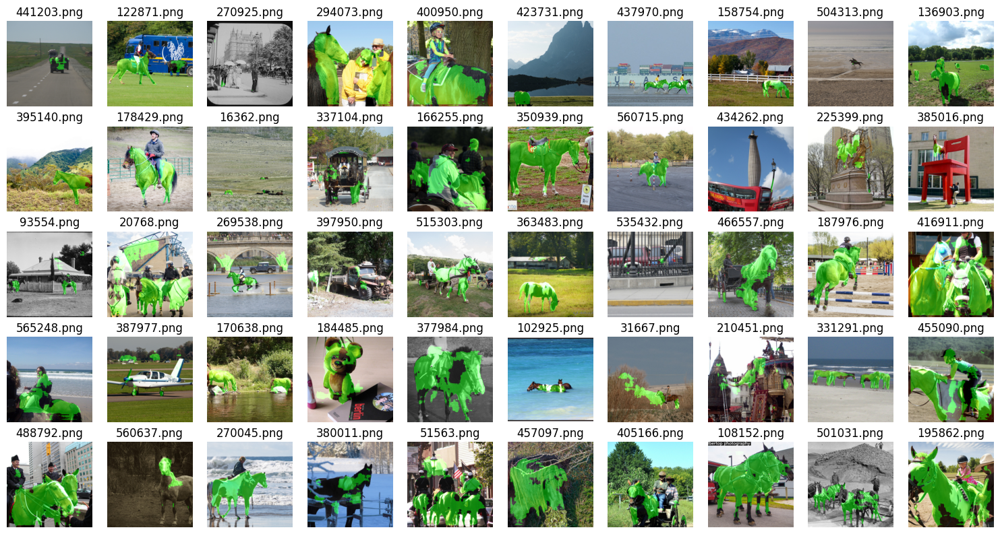

In [14]:
folder_path = 'images'
show_images(folder_path)

# Residual Unet with 2 layers and no pretrained weight

In [23]:

!python3 main.py --skip residual2layer --batch_size 5 --coco_path "{PATH_TO_COCO}"


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=False, skip='residual2layer', checkpoint='residual2layer_False_checkpoint.pth')
--------------------------------------------------PRE LOADED False
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Traceback (most recent call last):
  File "/home/manavjeet/git/ML/unet/main.py", line 323, in <module>
    main(args)
  File "/home/manavjeet/git/ML/unet/main.py", line 205, in main
    train_model(args, model, dataloaders, optimizer_ft, exp_lr_scheduler)
  File "/home/manavjeet/git/ML/unet/main.p

In [11]:
!python3 main.py --skip residual2layer --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=False, skip='residual2layer', checkpoint='residual2layer_False_checkpoint.pth')
--------------------------->BATCH SIZE: 5
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Performance on validation dataset: mIoU:0.4079553782939911 , mDice:0.5351386070251465


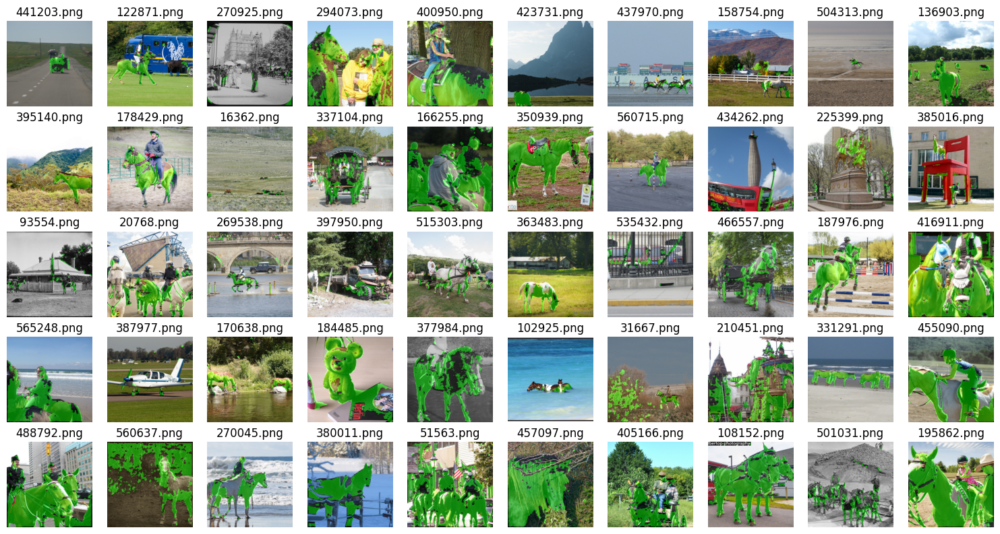

In [12]:
folder_path = 'images'
show_images(folder_path)

# Residual 2 Layer Unet with pretrained resnet layers

In [10]:

!python3 main.py --skip residual2layer --batch_size 5 --coco_path "{PATH_TO_COCO}" --load_pretrained 


device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=False, load_pretrained=True, skip='residual2layer', checkpoint='residual2layer_True_checkpoint.pth')
--------------------------------------------------PRE LOADED True
/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/nativ

In [11]:
!python3 main.py --skip residual2layer --batch_size 5 --coco_path "{PATH_TO_COCO}" --eval  --load_pretrained

device cuda
Namespace(coco_path='/home/manavjeet/git/ML/coco/', batch_size=5, epochs=20, eval=True, load_pretrained=True, skip='residual2layer', checkpoint='residual2layer_True_checkpoint.pth')
--------------------------->BATCH SIZE: 5
--------------------------------------------------PRE LOADED True
/home/manavjeet/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
Computational complexity:       55.83 GMac
Number of parameters:           510.85 k
--------------------------------------------------PRE LOADED True
------------------- float32 -------------------
Doing nothing
/home/manavjeet/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system 

In [1]:
mIoUs= {
    1:  0.393457,
    2: 0.366314,
    3: 0.395151,
    4: 0.349869,
    5: 0.068339,
    6: 0.390971,
    7: 0.377613,
    8: 0.410509,
    9: 0.420419,
    10: 0.274105,
    11: 0.373009,
    12: 0.241159,
    13: 0.362246,
    14: 0.377010,
    15: 0.190392,
    16: 0.311782,
    17: 0.282539,
    18: 0.150819,
    19: 0.414999,
    20: 0.422314,
}

In [7]:
import matplotlib
from matplotlib import pyplot as plt
import numpy as np

Text(0.5, 1.0, 'mIoU on the validation set while training')

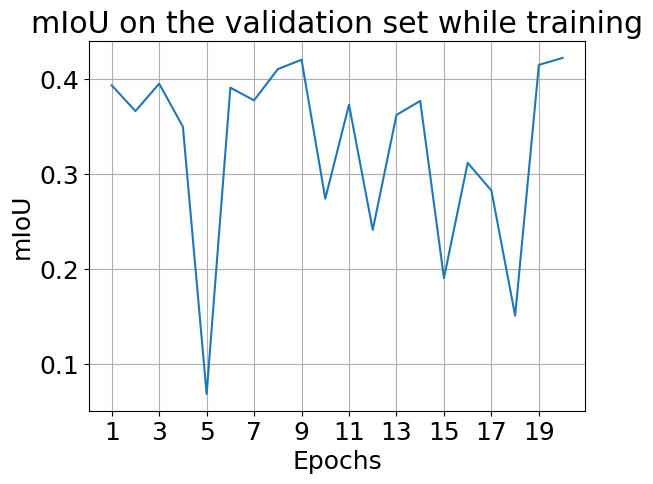

In [10]:
matplotlib.rcParams.update({'font.size': 18})
plt.plot(np.array(list(mIoUs.keys())),mIoUs.values())
plt.xticks(np.arange(1,21,2))
plt.grid()
plt.xlabel("Epochs")
plt.ylabel("mIoU")
plt.title("mIoU on the validation set while training")

In [42]:
20/50


0.4

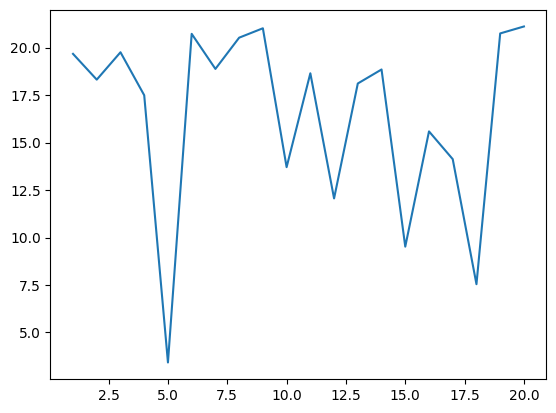

In [31]:

plt.plot(np.array(list(b.keys()))+1,b.values())
plt.xtc

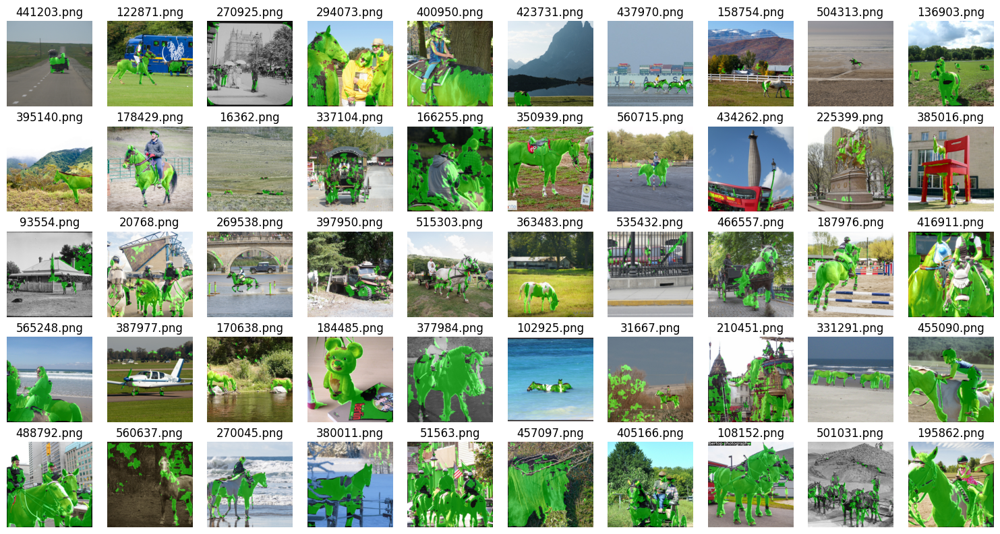

In [12]:
folder_path = 'images'
show_images(folder_path)

# Testing

In [16]:
from unet import DoubleConv,Down,Up,OutConv,DecoderBlock
import torch.nn as nn
import torch 
from torchvision.models import resnet34, ResNet34_Weights
class Residual2LayerUNet(nn.Module):
    def __init__(self, n_classes, bilinear=False,load_pretrained_encoder_layers=True):

        if load_pretrained_encoder_layers:
            resnet = resnet34(weights=ResNet34_Weights.DEFAULT)
            l1=resnet.layer1
            l2=resnet.layer2

            for param in l1.parameters():
                param.requires_grad = False

            for param in l2.parameters():
                param.requires_grad = False
        else:
            resnet=resnet34(weights=None)
            l1=resnet.layer1
            l2=resnet.layer2


        super().__init__()
        self.n_channels = 3
        self.n_classes = n_classes
        self.bilinear = bilinear
        self.base_layers = []

        self.inc = (DoubleConv(3, 64))
        self.down1 = l1
        factor = 2 if bilinear else 1
        self.down2 = l2
        self.up1 = (Up(128, 128 // factor, bilinear))
        self.up2 = (Up(128, 64, bilinear))
        self.outc = (OutConv(64, n_classes))

    def forward(self, x):
        x1 = self.inc(x)
        print("x1",x1.shape)
        x2 = self.down1(x1)
        print("x2",x2.shape)
        x3 = self.down2(x2)
        print("x3",x3.shape)
        x = self.up1(x3, x2)
        print("x",x.shape)
        x = self.up2(x, x1)
        print("x",x.shape)
        logits = self.outc(x)
        print("logits",logits.shape)
        return logits

In [18]:
net=Residual2LayerUNet(n_classes=1)
net=net.cuda()
net(torch.zeros((1,3,64,64)).cuda())

x1 torch.Size([1, 64, 64, 64])
x2 torch.Size([1, 64, 64, 64])
x3 torch.Size([1, 128, 32, 32])
x torch.Size([1, 128, 64, 64])
x torch.Size([1, 64, 64, 64])
logits torch.Size([1, 1, 64, 64])


tensor([[[[-0.9114, -0.1280, -0.2161,  ..., -0.9182, -0.2896, -0.2836],
          [-0.1212, -0.0890,  0.1045,  ..., -0.0260, -0.0864, -0.3877],
          [-0.2285,  0.3139, -0.6573,  ...,  0.3301, -0.5627,  0.0502],
          ...,
          [-0.4730,  0.1271,  0.0889,  ...,  0.2549,  0.0960, -0.6105],
          [-0.3988,  0.3114, -0.4244,  ...,  0.5175, -0.4371, -0.2357],
          [-0.4238,  0.0156, -0.3120,  ..., -0.0192, -0.2193, -0.4570]]]],
       device='cuda:0', grad_fn=<ConvolutionBackward0>)